# Explorative Datenanalyse Part 3

In [2]:
from config import *
# Arbeite von jetzt an mit den gesäuberten Daten
# (siehe prepare.data_loader.load_data für Erläuterung)
df = load_data('_cleaned_L2')

In [9]:
print('Structures according to RNALoops authors: ~', 84000)
print('Structures found in RNALoops: ~', 80000)
print('Structures after preparation:', len(load_data('_prepared')))
print('Structures after cleaning L1:', len(load_data('_cleaned_L1')))
print('Structures after cleaning L2:', len(load_data('_cleaned_L2')))
print('Structures after cleaning L3:', len(load_data('_cleaned_L3')))

Structures according to RNALoops authors: ~ 84000
Structures found in RNALoops: ~ 80000
Structures after preparation: 75221
Structures after cleaning L1: 74189
Structures after cleaning L2: 71661
Structures after cleaning L3: 66386


### Planare Winkel nach Kategorie

Wir konzentrieren uns auf die planaren Winkel, da diese die 'Abstände' der Helices am besten widerspiegeln.

Wir können diese für die way-3 Strukturen in je zwei Plots (1vs2 und 2vs3) darstellen. Dabei farblich unterteilen nach:
1) whole_sequence -> Sequenz des Multiloops aus RNALoops
2) parts_seq -> wie 1), aber zusätzlich unterteilt wenn Sequenz gleich aber Bindungen verschieden
3) home_structure -> pdb_id der Struktur
4) cluster -> cluster gefunden mittels agglomerativem Clustering

Die ersten beiden sind ähnlich, wir müssen da genauer hinsehen um unterschiede festzustellen. \
Dazu werden mittels main_explore.py Plots erzeugt, die unter results/angles gespeichert sind. Hier wird der Unterschied von 1) und 2) deutlich.

Bei der pdb_id sieht man keine Abhängigkeit. Eine gegebene Sequenz findet sich durchschnittlich in 1.5 home Strukturen, unabhängig von ihrer Häufigkeit. \
Das heißt eine Sequenz die 150 mal vorkommt wurde in etwa aus 100 verschiedenen home Strukturen extrahiert.

Wir sehen, dass gleiche Sequenzen ähnliche Winkel haben, da die Farben clustern. \
Wir sehen aber auch, dass per agglomerativem Clustering noch viel deutlichere Cluster gefunden werden können, also gibt es wohl noch Ähnlichkeiten über die Sequenz hinaus.

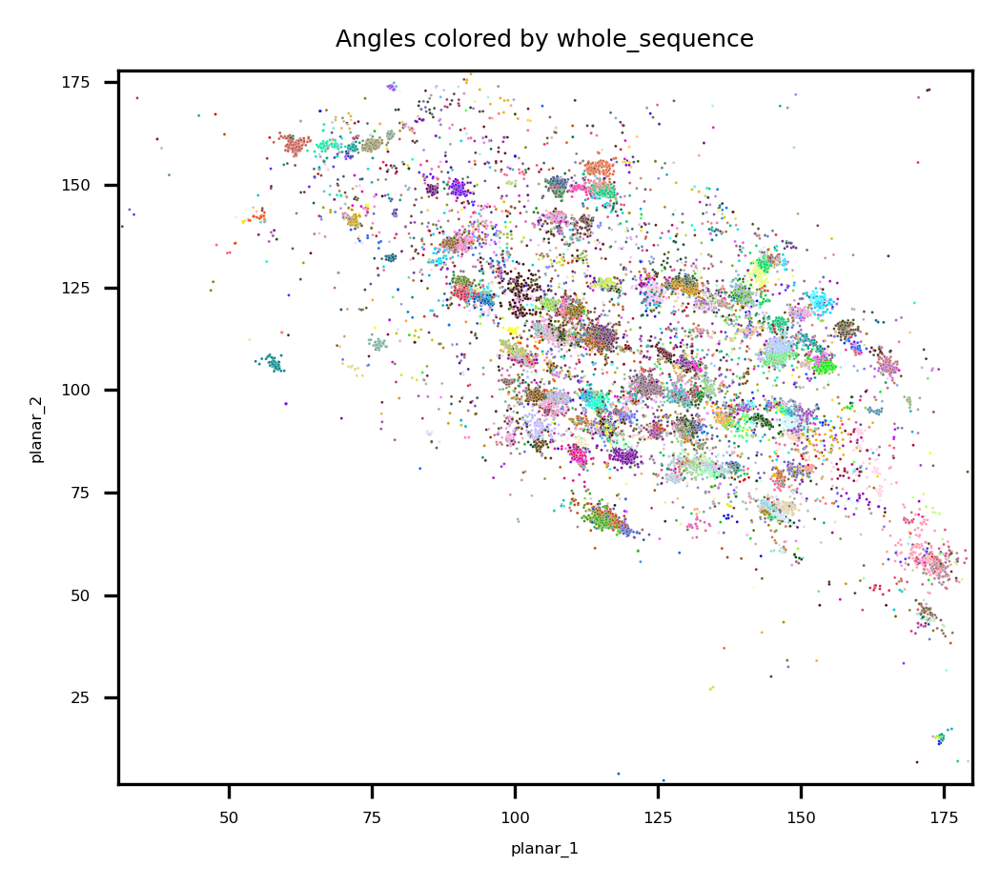

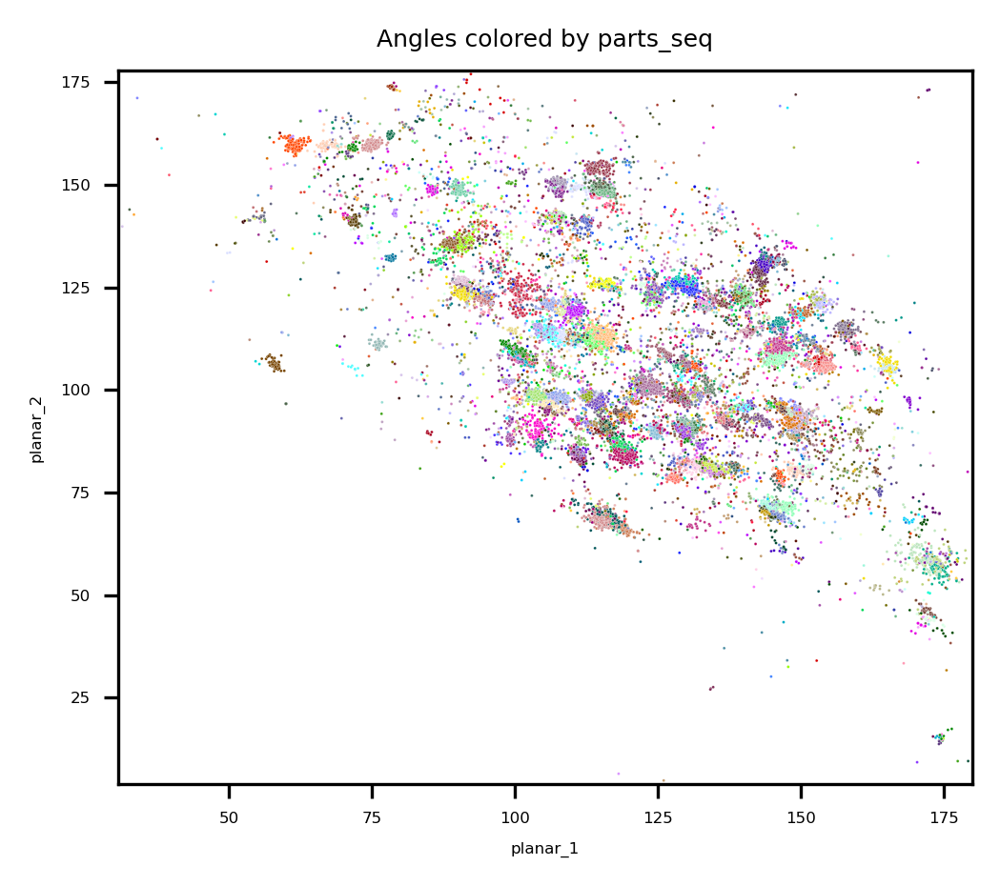

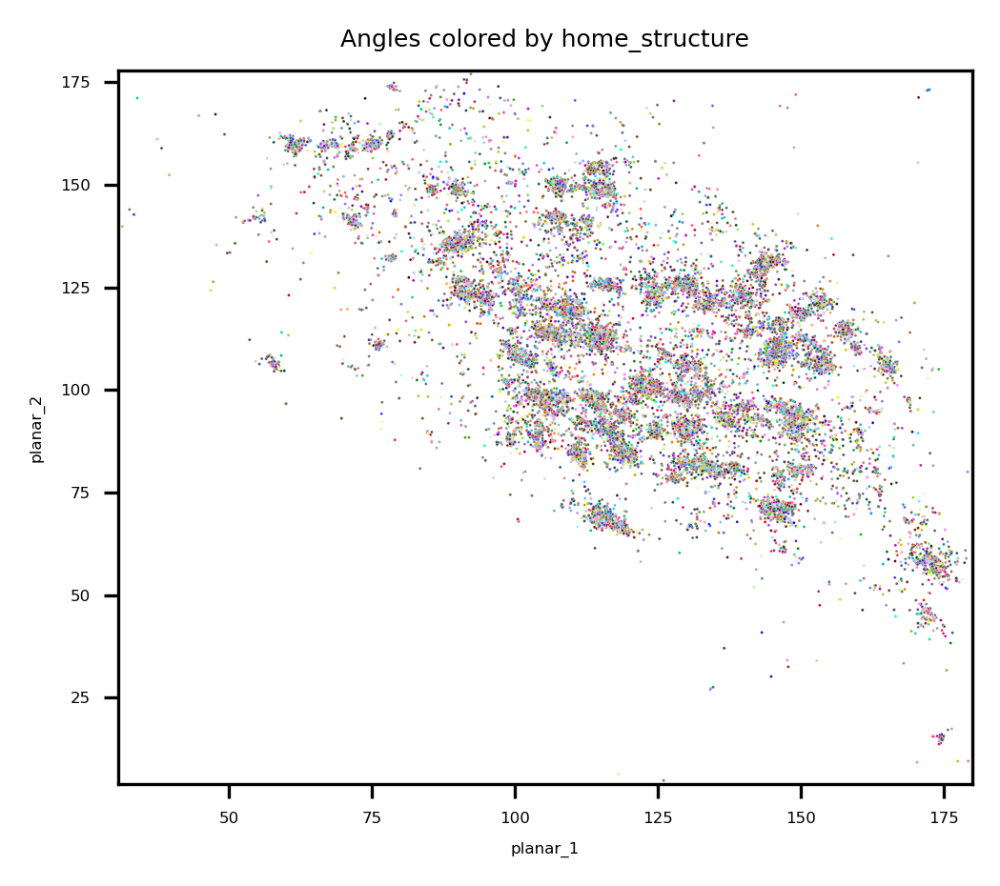

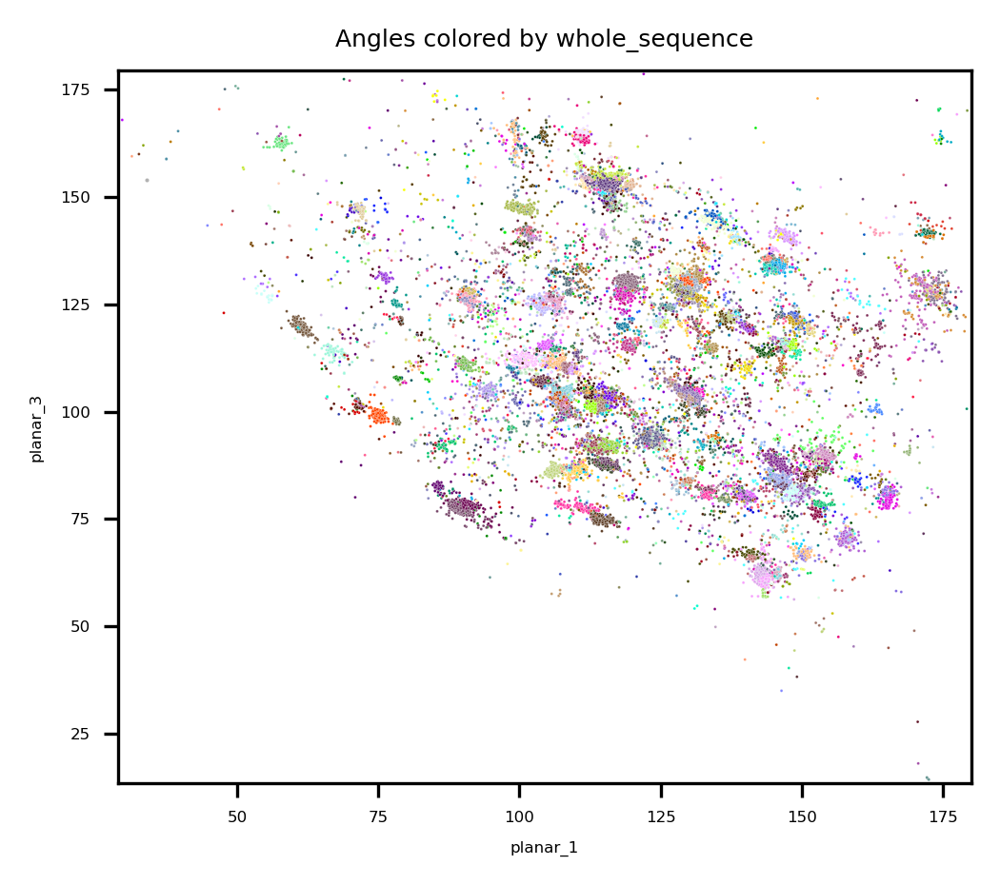

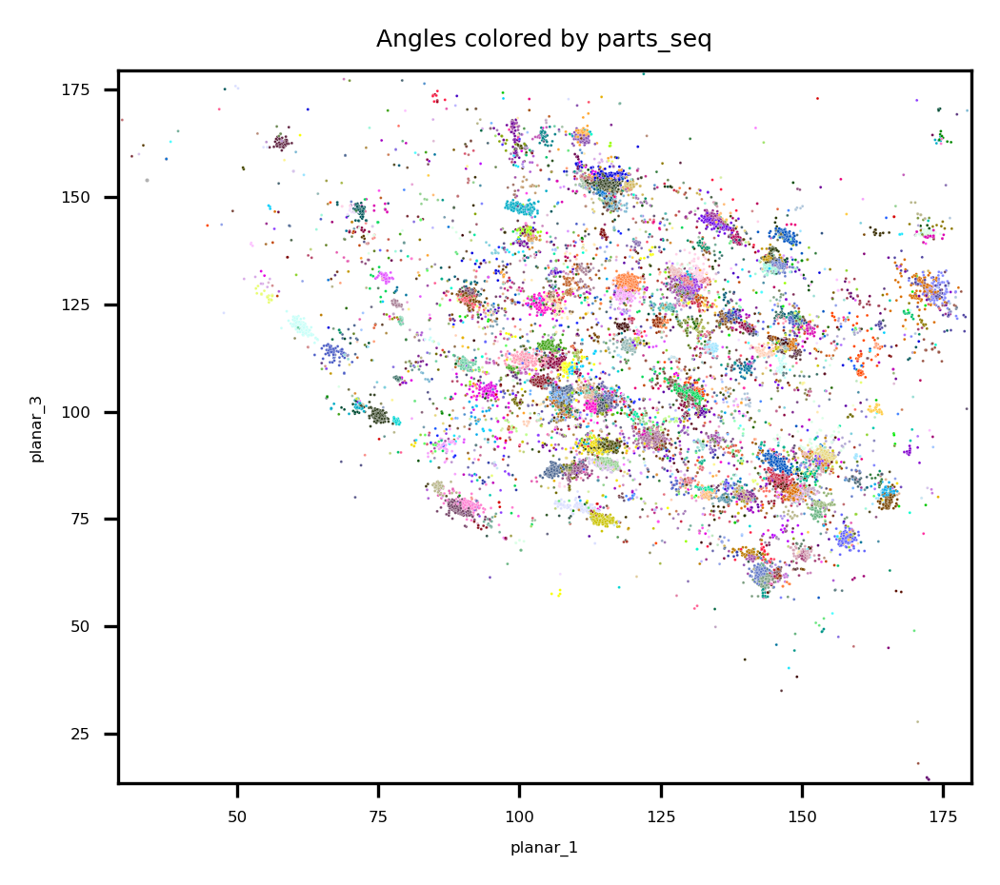

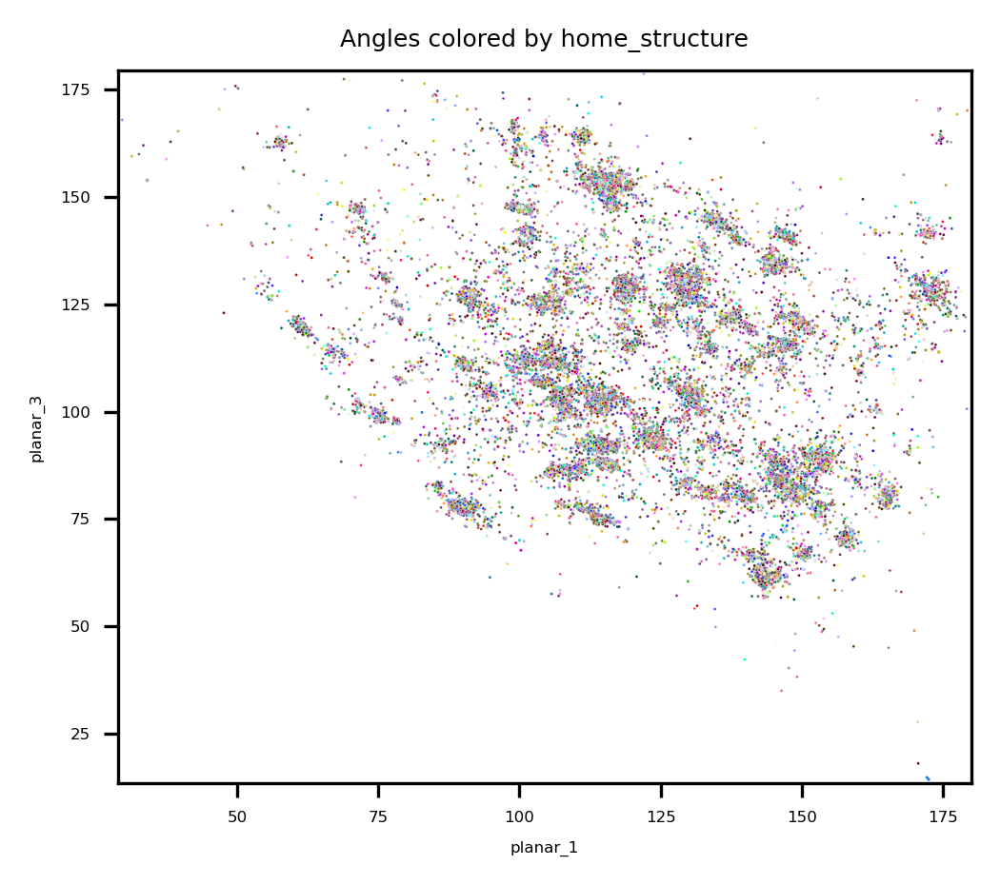

In [4]:
kwargs = dict(fs=4, contam=10**-6, dpi=300, save=True, do_cluster=False,
              ms_data=0.5)

for f in [["planar_1", "planar_2"], ["planar_1", "planar_3"]]:
    cluster_angles(df.way3, f, hue_col="whole_sequence", **kwargs)
    cluster_angles(df.way3, f, hue_col="parts_seq", **kwargs)
    cluster_angles(df.way3, f, hue_col="home_structure", **kwargs)

### Gemittelte Planarwinkel nach Sequenz

Wir können die Winkel aller Strukturen einer Sequenz mitteln, und die Ergebnisse vergleichen.

Im Folgenden sind Sequenzen mit mehr als 100 Strukturen mit ihren mittleren Winkeln dargestellt. \
Die Größe der grauen Kreise schätzt die Streuung der Winkel innerhalb der Sequenz Klasse ab.

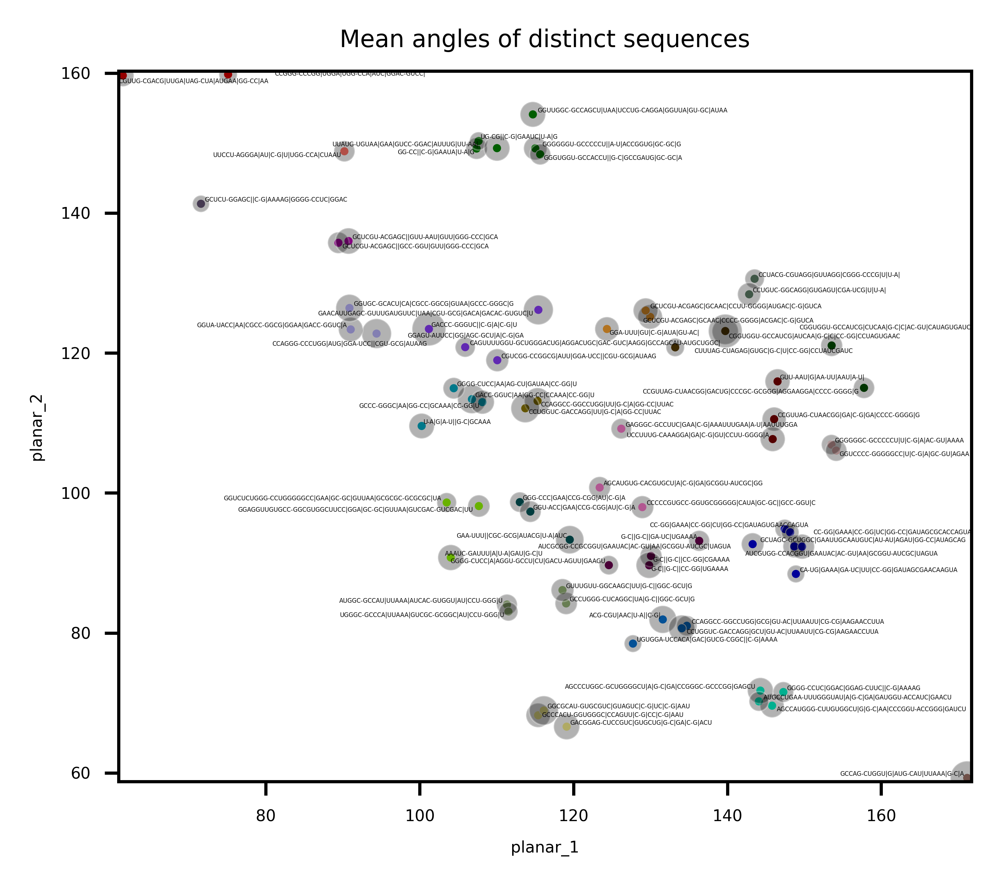

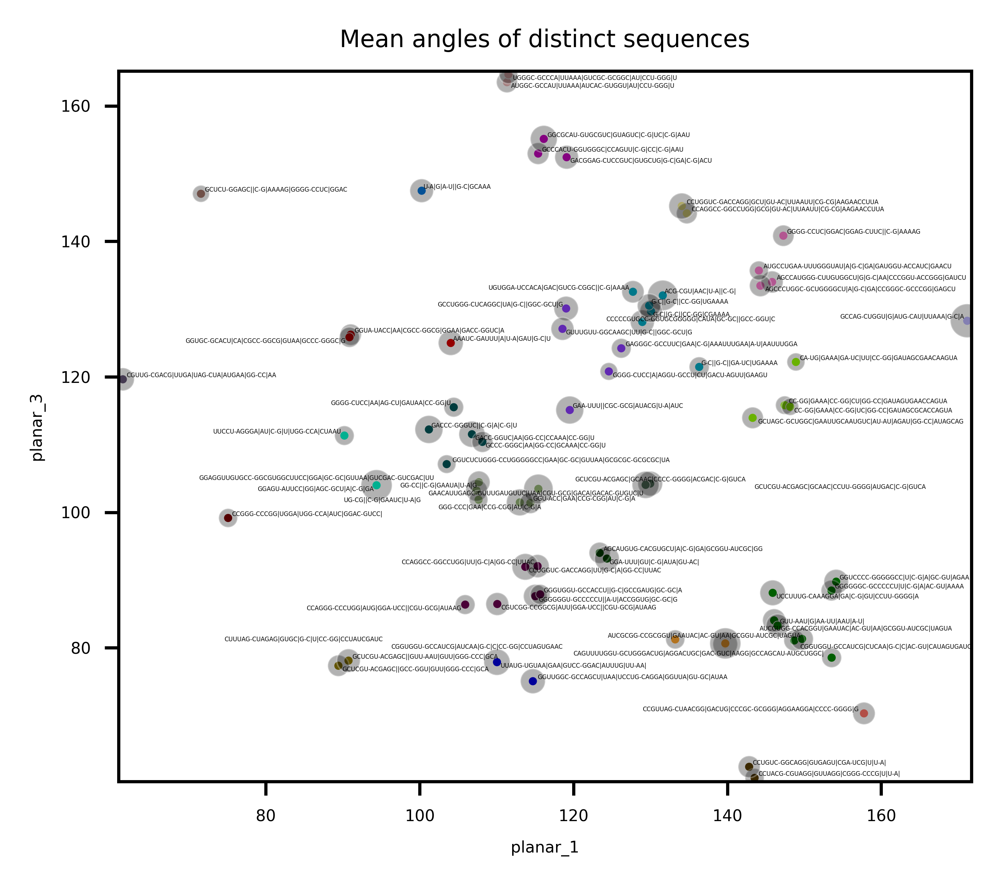

In [79]:
kwargs = dict(
    n_cluster=25,
    contam=1,
    n_neighbors=1,
    ms_data=5,
    ms_other=1,
    plot_labels=True,
    annot_perc=100,
    dpi=800,
    title='Mean angles of distinct sequences',
    fs=4,
    save=True,
    extension='mean',
)

data = get_sequence_mean_angles(get_frequent_sequences(df.way3), 'index')

for f in [["planar_1", "planar_2"], ["planar_1", "planar_3"]]:
    std_cols = [c + '_std' for c in f]
    size_col = np.sqrt(data[std_cols[0]]**2/2 + data[std_cols[1]]**2/2)
    ax = cluster_angles(data, feature=f, size_col=size_col, **kwargs)

Wir können auch alle Sequenzen darstellen, dann aber ohne Annotation, das wird zu unübersichtlich:

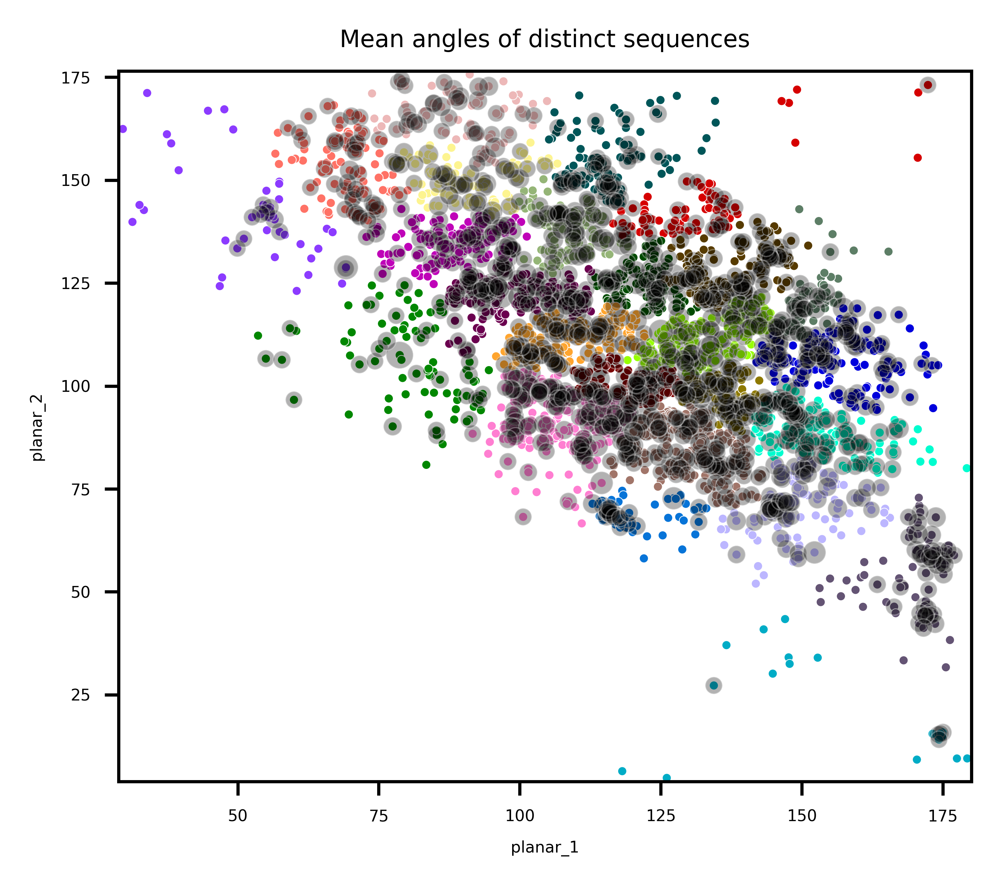

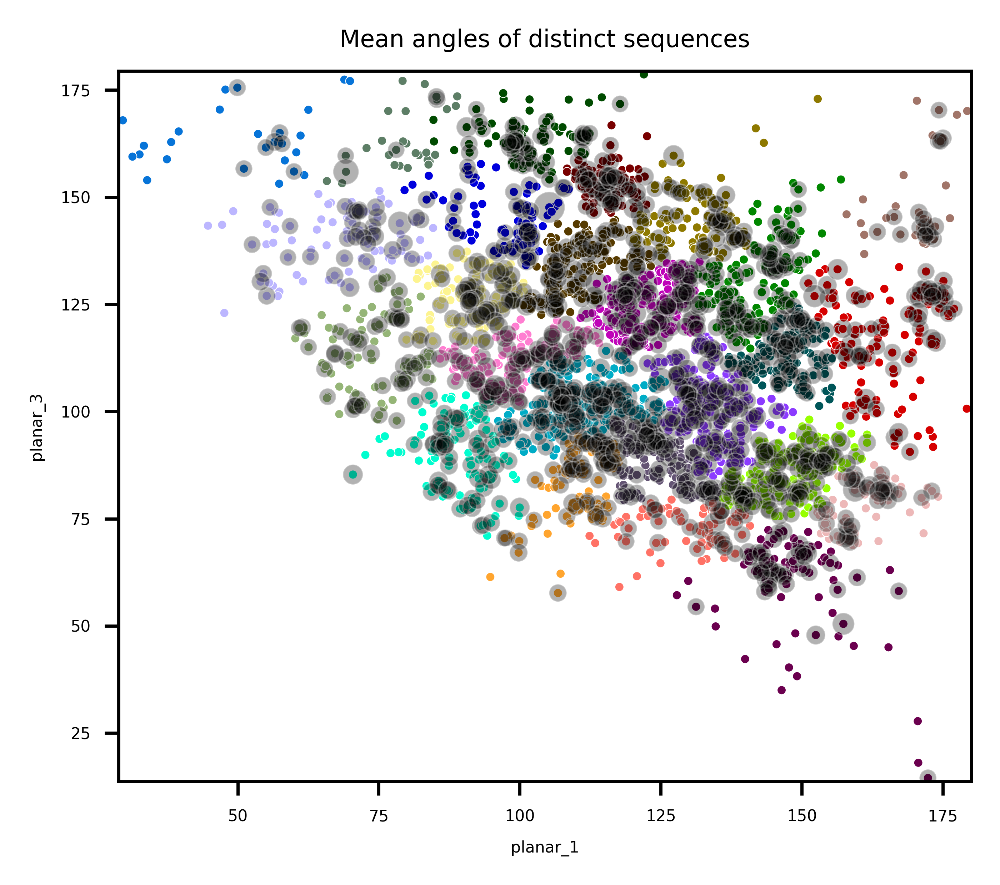

In [80]:
data = get_sequence_mean_angles(get_frequent_sequences(df.way3, min_n=1), 
                                'index')

kwargs['annot_perc'] = 0
kwargs['extension'] = 'mean_all'

for f in [["planar_1", "planar_2"], ["planar_1", "planar_3"]]:
    std_cols = [c + '_std' for c in f]
    size_col = np.sqrt(data[std_cols[0]]**2/2 + data[std_cols[1]]**2/2)
    ax = cluster_angles(data, feature=f, size_col=size_col, **kwargs)

Wir können anhand davon jetzt untersuchen welche Sequenzen signifikant verschiedene Winkel haben und welche nicht. \
In results/similars liegen dazu csv Dateien die für gegebene Seqenzen alle ähnlichen Sequenzen auflisten.

Als nächstes können wir auch noch weitere Feature konstruieren, wie z.B. die Länge der Sequenz. \
Notebook eda_4.ipynb konzentrierte sich dann auf die gemittelten Winkel und weitere Feature, sowie Vorbereitung von Clustering.